# Using Alphalens to Analyze Kalman Filter Spread Returns

## Using Clusters from Quantopian Data

#### By Kenny Potts

I will import in some clusters from a txt file which I have created using daily price variation and the Sklearn clustering example found [here](http://scikit-learn.org/stable/auto_examples/applications/plot_stock_market.html).

In [1]:
import numpy as np
import pandas as pd

import statsmodels
import statsmodels.api as sm
from statsmodels.tsa.stattools import coint
# Just set the seed for the random number generator
np.random.seed(107)

import matplotlib.pyplot as plt
%matplotlib inline

import pandas_datareader.data as web
import scipy as sp
from scipy import stats
from matplotlib import style
import seaborn

from pykalman import KalmanFilter

import alphalens as al

import itertools

In [2]:
import warnings
warnings.filterwarnings('ignore')

In [3]:
style.use('seaborn-poster')
style.use('seaborn-whitegrid')
style.use('seaborn-notebook')

Let's read in the clusters and the symbols

In [31]:
f = open('stock_clusters_2013_unlabeled.txt','r')
read_in = f.read()
lines = read_in.split('\n')
clusters_list = [line.replace(' ','').split(',') for line in lines]
all_symbols = read_in.replace('\n',',').replace(' ','').split(',')

In [32]:
clusters_list[1]

['EIX',
 'DD',
 'APC',
 'EA',
 'WLL',
 'AVP',
 'BDX',
 'DAL',
 'SWN',
 'SYY',
 'GWW',
 'TOL',
 'HCP',
 'CMA',
 'WYN',
 'BIIB',
 'INTC',
 'ATVI']

These clusters where generated from 2013 data, so I will bring in the 2013 to 2015 data. This way we can test for cointegration on the 2013 data, and test our factor model on the 2014 data.

In [34]:
prices_test = web.DataReader(all_symbols, data_source='yahoo',
                        start='2013-01-01', end='2015-01-01')

realize I used a poor variable name there...

In [35]:
prices = prices_test

This was a large amount of data, which took a long time to download, so I am going to store it on my disk using HDF5 so that I can rapidly access it without redownloading.

In [36]:
with pd.HDFStore('stock_data.h5') as store:
    store['clusters_pricing'] = prices

## Analyzing Pairs within Clusters

I will only be looking at the adjusted closing prices.

In [37]:
prices_close = prices['Adj Close']

In [39]:
prices_close.head()

,A,AAPL,ABC,ABT,ACN,ADBE,ADI,ADM,ADP,ADS,...,WYNN,X,XEL,XLNX,XOM,XRX,YHOO,YUM,ZBH,ZNGA
Date,,,,,,,,,,,,,,,,,,,,,
2013-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-01-02,28.676587,71.763763,40.902192,29.095192,62.429150,38.340000,39.100062,25.805151,46.500870,148.320458,...,103.391104,24.861977,23.422606,33.434384,77.706463,4.242482,20.080000,43.901988,65.215838,2.39
2013-01-03,28.779297,70.857944,40.817547,30.202717,62.203154,37.750000,38.469130,25.598134,46.684038,149.514677,...,104.503210,24.410640,23.354169,33.371284,77.566313,4.242482,19.780001,44.176539,66.150246,2.41
2013-01-04,29.347625,68.884221,41.090288,30.021155,62.546672,38.130001,37.784879,26.300191,47.098159,150.370526,...,105.764187,24.679523,23.439716,32.902535,77.925453,4.195277,19.860001,44.660274,66.487402,2.63
2013-01-07,29.135359,68.479021,41.221961,30.266263,62.275474,37.939999,37.900403,25.211101,46.914988,153.664543,...,106.123217,24.689124,23.191632,32.767318,77.023215,4.266084,19.400000,44.379185,66.651170,2.62


I am going to clean this data a little by dropping rows where all values are NAN.

In [47]:
prices_close.shape

(523, 417)

In [72]:
prices_close.dropna(axis=1,thresh=400).head()

,A,AAPL,ABC,ABT,ACN,ADBE,ADI,ADM,ADP,ADS,...,WYNN,X,XEL,XLNX,XOM,XRX,YHOO,YUM,ZBH,ZNGA
Date,,,,,,,,,,,,,,,,,,,,,
2013-01-02,28.676587,71.763763,40.902192,29.095192,62.429150,38.340000,39.100062,25.805151,46.500870,148.320458,...,103.391104,24.861977,23.422606,33.434384,77.706463,4.242482,20.080000,43.901988,65.215838,2.39
2013-01-03,28.779297,70.857944,40.817547,30.202717,62.203154,37.750000,38.469130,25.598134,46.684038,149.514677,...,104.503210,24.410640,23.354169,33.371284,77.566313,4.242482,19.780001,44.176539,66.150246,2.41
2013-01-04,29.347625,68.884221,41.090288,30.021155,62.546672,38.130001,37.784879,26.300191,47.098159,150.370526,...,105.764187,24.679523,23.439716,32.902535,77.925453,4.195277,19.860001,44.660274,66.487402,2.63
2013-01-07,29.135359,68.479021,41.221961,30.266263,62.275474,37.939999,37.900403,25.211101,46.914988,153.664543,...,106.123217,24.689124,23.191632,32.767318,77.023215,4.266084,19.400000,44.379185,66.651170,2.62
2013-01-08,28.902549,68.663325,41.165530,30.275340,62.637069,38.139999,37.509400,25.508126,47.185759,154.460684,...,106.035644,24.016921,23.234405,32.100254,77.504996,4.260183,19.660000,42.516161,66.747499,2.50


In [61]:
prices_close = prices_close.drop(prices_close.index[prices_close.isnull().sum(axis=1)>400])

In [ ]:
prices_close.columns

In [66]:
no_data_pairs = prices_close.columns[prices_close.isnull().sum(axis=0) > 0]

In [70]:
prices_close = prices_close.drop(prices_close.columns[prices_close.isnull().sum(axis=0) > 0], axis=1)

In [71]:
prices_close.columns[prices_close.isnull().sum(axis=0) > 0]

Index([], dtype='object')

we should remove the assets with no data form our clusters list.

In [73]:
new_list = []
for cluster in clusters_list:
    new_cluster = []
    for asset in cluster:
        if asset not in no_data_pairs:
            new_cluster.append(asset)
    if len(new_cluster) > 1:
        new_list.append(new_cluster)

In [75]:
clusters_list = new_list

### Isolate our cointegration training data
We will only use 2013 prices to test for cointegration.

In [77]:
prices_close.index[250:260]

DatetimeIndex(['2013-12-30', '2013-12-31', '2014-01-02', '2014-01-03',
               '2014-01-06', '2014-01-07', '2014-01-08', '2014-01-09',
               '2014-01-10', '2014-01-13'],
              dtype='datetime64[ns]', name='Date', freq=None)

In [79]:
prices_close.loc[:'2014-01-02',:].shape

(253, 396)

In [80]:
prices_close_train = prices_close.loc[:'2014-01-02',:]

## Extract cointegrated pairs within clusters

In [83]:
def find_cointegrated_pairs(data, cutoff=0.05):
    n = data.shape[1]
    score_matrix = np.zeros((n, n))
    p_value_matrix = np.zeros((n, n))
    keys = data.keys()
    pairs = []
    for i in range(n):
        for j in range(i+1, n):
            s1 = data[keys[i]]
            s2 = data[keys[j]]
            result = coint(s1, s2)
            score = result[0]
            p_value = result[1]
            score_matrix[i, j] = score
            p_value_matrix[i, j] = p_value
            if p_value < cutoff:
                pairs.append((keys[i], keys[j]))
    return score_matrix, p_value_matrix, pairs

We will use this function to test for cointegration among pairs cluster by cluster.

Let's try it on a single cluster.

[('SYK', 'CELG'), ('UAL', 'TDC')]


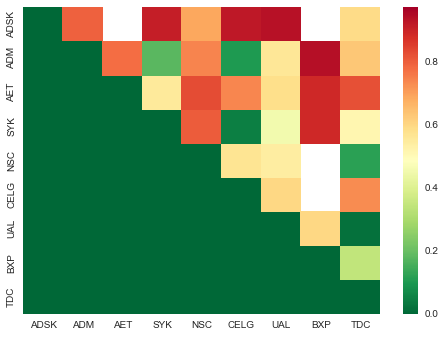

In [90]:
# Heatmap to show the p-values of the cointegration test between each pair of
# stocks. Only show the value in the upper-diagonal of the heatmap
cluster_num = 3

scores, p_values, pairs = find_cointegrated_pairs(prices_close_train.loc[:,clusters_list[cluster_num]],cutoff=0.1)

seaborn.heatmap(p_values, xticklabels=prices_close_train.loc[:,clusters_list[cluster_num]].columns.tolist(),
                yticklabels=prices_close_train.loc[:,clusters_list[cluster_num]].columns.tolist(),
                cmap='RdYlGn_r',
                mask=(p_values >= 0.95))

print(pairs)

There are two pairs within this cluster that are cointegrated. Let's run this for all of our clusters.

In [101]:
cointegrated_pairs = []
for cluster in clusters_list:
    scores, p_values, pairs = find_cointegrated_pairs(prices_close_train.loc[:,cluster])#,cutoff=0.1)
    cointegrated_pairs.extend(pairs)

In [102]:
cointegrated_pairs

[('SYK', 'CELG'),
 ('UAL', 'TDC'),
 ('ADI', 'MGM'),
 ('EBAY', 'FTI'),
 ('EBAY', 'FLR'),
 ('EBAY', 'LLTC'),
 ('EBAY', 'ED'),
 ('EBAY', 'INTU'),
 ('EBAY', 'BBT'),
 ('EBAY', 'GGP'),
 ('EBAY', 'WM'),
 ('EBAY', 'DLR'),
 ('EBAY', 'BK'),
 ('EBAY', 'EXPE'),
 ('EBAY', 'SINA'),
 ('EBAY', 'STT'),
 ('EBAY', 'HPQ'),
 ('KBH', 'SPG'),
 ('FAST', 'M'),
 ('ZNGA', 'DO'),
 ('XLNX', 'EQIX'),
 ('MCHP', 'ALXN'),
 ('NUAN', 'HST'),
 ('CLX', 'HST'),
 ('AMAT', 'HUM'),
 ('DFS', 'TSN'),
 ('CCI', 'BSX'),
 ('CCI', 'GIS'),
 ('CCI', 'HSY'),
 ('CCI', 'PCAR'),
 ('ABT', 'DRI'),
 ('LRCX', 'DLPH'),
 ('GME', 'DLPH'),
 ('MCO', 'COST'),
 ('CMG', 'PPG'),
 ('JOY', 'HFC'),
 ('MDT', 'PETM'),
 ('MDT', 'CME'),
 ('APD', 'BWA'),
 ('MO', 'MSFT'),
 ('MO', 'GLW'),
 ('MRO', 'NEM'),
 ('MRO', 'PETM'),
 ('MRO', 'BWA'),
 ('MRO', 'CME'),
 ('MRO', 'PNC'),
 ('MRO', 'WFC'),
 ('NBL', 'PETM'),
 ('NBL', 'BWA'),
 ('NFLX', 'BWA'),
 ('NFLX', 'TXN'),
 ('PETM', 'BWA'),
 ('PETM', 'CME'),
 ('PETM', 'PNC'),
 ('PETM', 'WFC'),
 ('CME', 'WFC')]

In [103]:
len(cointegrated_pairs)

56

Let's plot some of these pairs to make sure everything is going as planned.

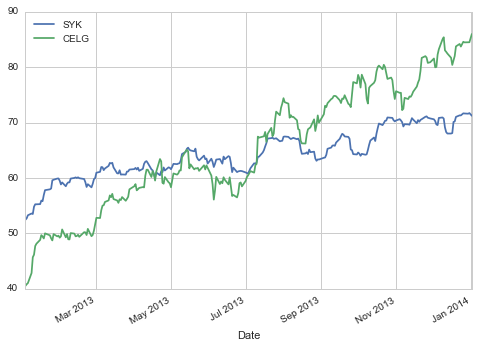

In [104]:
prices_close_train.loc[:,cointegrated_pairs[0]].plot();

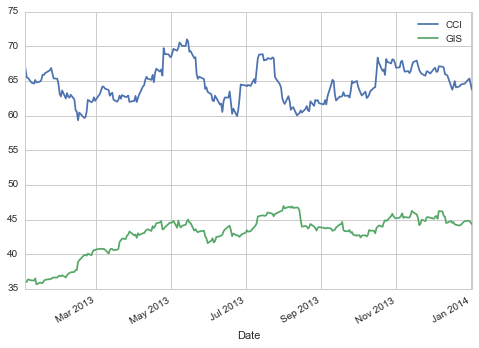

In [107]:
prices_close_train.loc[:,cointegrated_pairs[27]].plot();

# Analyzing Kalman Spread Z-scores as a factor with Alphalens

### In Sample

We will use alphalens to analyze the predictive ability of our kalman beta spread z-score factor. **We will first test using our in sample period of 2013.**

We are trading the spreads themselves, so I will construct a pandas dataframe that uses the spreads as the asset prices.

In [114]:
def get_spread_dataframe(data, pairs):
    spreads = pd.DataFrame(np.zeros((data.shape[0], len(pairs))),
             index=data.index,
             columns=pairs)
    
    # calculate kalman betas and spreads
    for pair in spreads.columns: # not sure how to do this without loop yet
        s1 = data[pair[0]]
        s2 = data[pair[1]]
        
        delta = 1e-7 # dictates the amount of change from period to period
                     # In our case, less change is better (more stable) so
                     # using a smaller delta here is preferable (1e-7,1e-8,1e-9...)
        trans_cov = delta / (1 - delta) * np.eye(2) # How much random walk wiggles
        obs_mat = np.expand_dims(np.vstack([[s1.values], [np.ones(len(s1))]]).T, axis=1)

        # construct kalman filter for spread beta
        kf = KalmanFilter(n_dim_obs=1, n_dim_state=2, # y is 1-dimensional ,(alpha, beta) is 2-dimensional
                          initial_state_mean=[0,0],
                          initial_state_covariance=np.ones((2, 2)),
                          transition_matrices=np.eye(2),
                          observation_matrices=obs_mat,
                          observation_covariance=2,
                          transition_covariance=trans_cov)
        # Use the obsercations y to get running estimates and errors for the state parameters
        state_means, state_covs = kf.filter(s2.values)
        spreads[pair] = s2 - state_means[:,0] * s1
    
    return spreads
    

Next we want to filter the spreads with a kalman filter, and also get our z-score factor.

In [109]:
def get_kal_filtered_spreads_and_z_scores(spreads, window=30):
    kalman_spreads = spreads.copy()
    kal_spread_z_scores = spreads.copy()
    
    for pair in spreads.columns:
        spread = spreads[pair]
        
        # Construct a Kalman Filter to filter spread
        kf = KalmanFilter(transition_matrices = [1],
                          observation_matrices = [1],
                          initial_state_mean = 0,
                          initial_state_covariance = 1,
                          observation_covariance = 1,
                          transition_covariance = 0.1)

        # Use the observed values of the price to get a rolling mean
        state_means2, _ = kf.filter(spread.values)

        kalman_spread = pd.Series(state_means2.flatten(), index=spread.index)
        # Get the 30 day moving average
        spread_mavg = spread.rolling(window=window).mean()
        
        std_rolling = spread.rolling(window=window).std()
        
        zscore_kalman_spread = (kalman_spread - spread_mavg)/std_rolling
        
        kalman_spreads[pair] = kalman_spread
        kal_spread_z_scores[pair] = zscore_kalman_spread
        
    return kalman_spreads, kal_spread_z_scores

In [110]:
spreads_1 = get_spread_dataframe(prices_close_train, cointegrated_pairs)

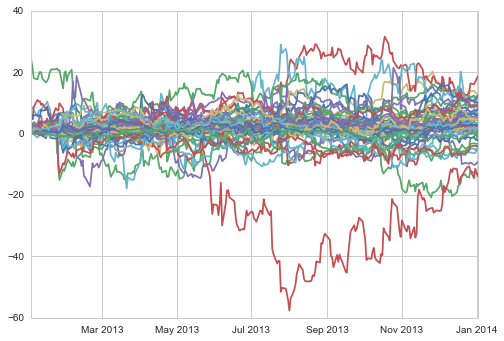

In [113]:
plt.plot(spreads_1);

In [116]:
lookback_window = 40

In [117]:
kal_spreads, kal_spread_zscores = \
get_kal_filtered_spreads_and_z_scores(spreads_1,window=lookback_window)

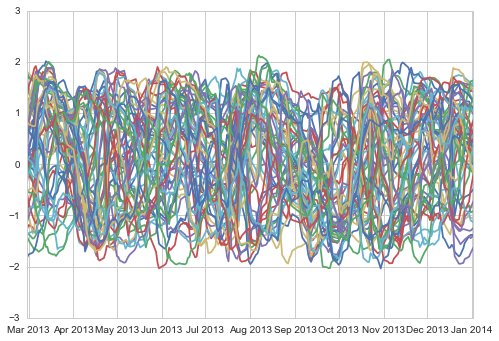

In [118]:
plt.plot(kal_spread_zscores);

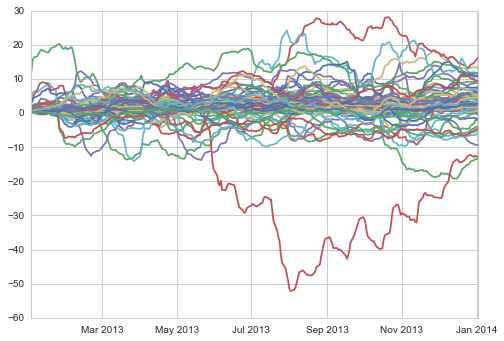

In [119]:
plt.plot(kal_spreads);

In [121]:
kal_spread_zscores_factor = kal_spread_zscores.stack()[lookback_window:]#remove nans and stack

I will feed alpha lends our negated z-score because we wish to short high z-score and long lower z-scores.
I will also add 60 to all our spread so that they stay positive (to symbolize a tradable asset)

In [122]:
kalman_spread_zscore_factor_data =\
al.utils.get_clean_factor_and_forward_returns(kal_spread_zscores_factor*(-1), 
                                              prices=(spreads_1.iloc[lookback_window:]+60),
                                              quantiles=4,
                                              periods=(1,2,3,4,5,10, 20, 30),
                                              bins=None)

Quantiles Statistics


,min,max,mean,std,count,count %
factor_quantile,,,,,,
1,-2.128718,0.107643,-1.228298,0.382261,2562,25.0
2,-1.610672,0.946705,-0.467035,0.474590,2562,25.0
3,-1.024966,1.371207,0.284017,0.484669,2562,25.0
4,-0.031808,2.035784,1.145481,0.383410,2562,25.0


Returns Analysis


,1,2,3,4,5,10,20,30
Ann. alpha,0.469,0.434,0.420,0.388,0.377,0.439,0.294,0.220
beta,0.778,0.941,0.965,1.188,1.245,0.577,1.257,0.572
Mean Period Wise Return Top Quantile (bps),20.246,39.279,58.128,79.824,102.260,195.309,347.506,362.230
Mean Period Wise Return Bottom Quantile (bps),-17.628,-34.483,-51.135,-69.639,-87.344,-162.586,-273.126,-282.959
Mean Period Wise Spread (bps),37.874,36.705,36.148,36.964,37.497,35.603,30.584,21.326


Information Analysis


,1,2,3,4,5,10,20,30
IC Mean,0.082,0.110,0.137,0.158,0.175,0.253,0.329,0.354
IC Std.,0.221,0.233,0.222,0.220,0.221,0.201,0.156,0.143
t-stat(IC),4.995,6.376,8.316,9.699,10.711,17.033,28.549,33.479
p-value(IC),0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
IC Skew,-0.143,-0.064,-0.073,-0.138,-0.192,-0.365,-0.304,0.282
IC Kurtosis,-0.667,-0.758,-0.735,-0.692,-0.469,-0.086,0.110,-0.644
Ann. IR,5.862,7.482,9.759,11.381,12.569,19.987,33.501,39.286


Turnover Analysis


,1,2,3,4,5,10,20,30
Quantile 1 Mean Turnover,0.096,0.172,0.240,0.299,0.352,0.585,0.787,0.823
Quantile 2 Mean Turnover,0.208,0.360,0.466,0.534,0.586,0.715,0.770,0.755
Quantile 3 Mean Turnover,0.202,0.343,0.449,0.533,0.602,0.744,0.775,0.782
Quantile 4 Mean Turnover,0.091,0.159,0.221,0.278,0.334,0.549,0.814,0.868


,1,2,3,4,5,10,20,30
Mean Factor Rank Autocorrelation,0.977,0.934,0.877,0.814,0.748,0.414,-0.065,-0.226


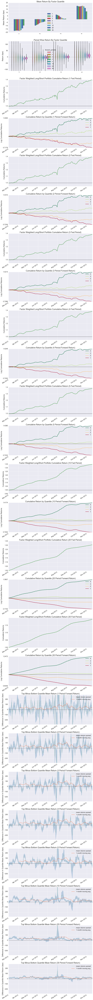

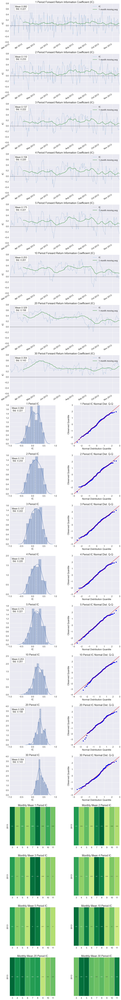

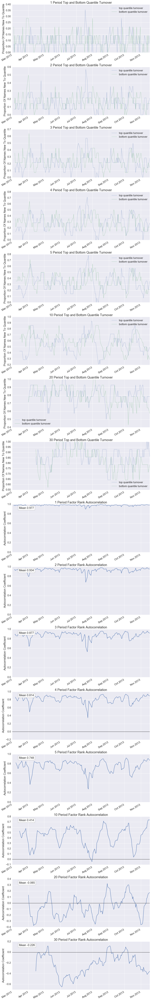

In [123]:
al.tears.create_full_tear_sheet(kalman_spread_zscore_factor_data)

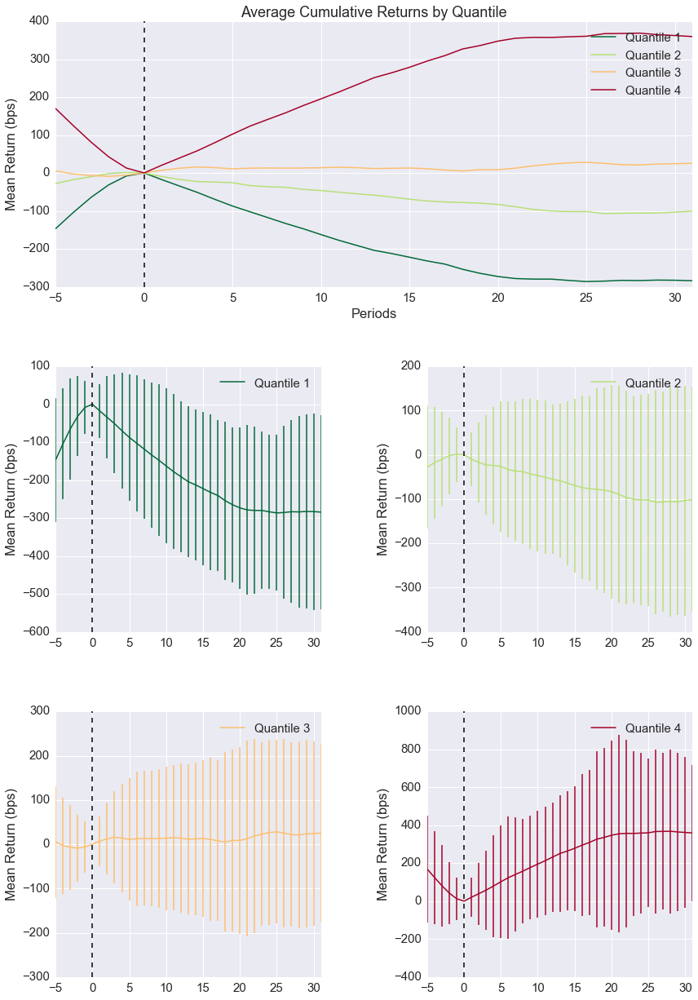

In [125]:
al.tears.create_event_returns_tear_sheet(kalman_spread_zscore_factor_data,
                                         prices=(spreads_1.iloc[lookback_window:]+60))

### Running Alphalens Out of Sample

Let's get our testing data.

In [126]:
prices_close_test = prices_close.loc['2014-01-02':,:]

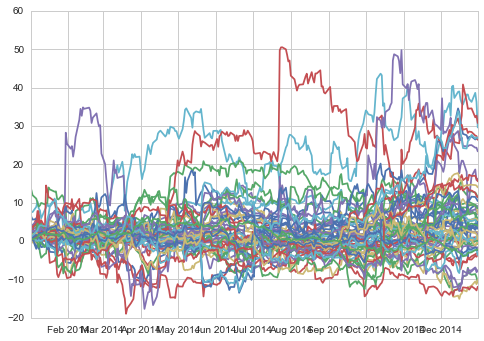

In [128]:
spreads_test = get_spread_dataframe(prices_close_test, cointegrated_pairs)
plt.plot(spreads_test);

In [129]:
lookback_window = 40
kal_spreads_test, kal_spread_zscores_test = \
get_kal_filtered_spreads_and_z_scores(spreads_test,window=lookback_window)

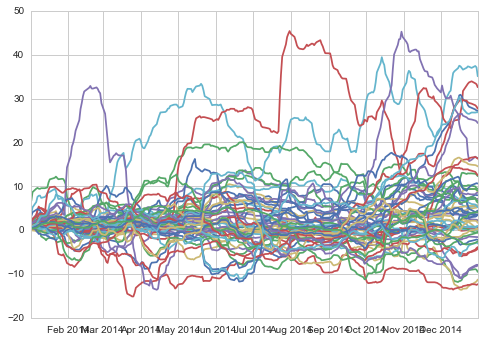

In [130]:
plt.plot(kal_spreads_test);

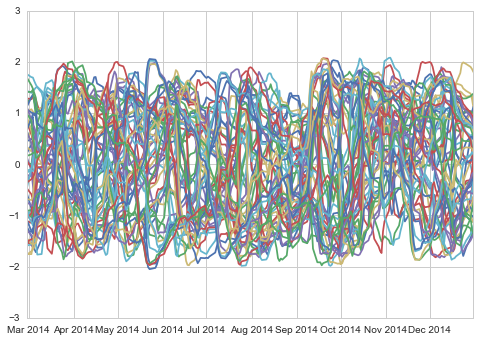

In [131]:
plt.plot(kal_spread_zscores_test);

In [132]:
kal_spread_zscores_factor_test = kal_spread_zscores_test.stack()[lookback_window:]#remove nans and stack

I will feed alpha lends our negated z-score because we wish to short high z-score and long lower z-scores.
I will also add 60 to all our spread so that they stay positive (to symbolize a tradable asset)

In [133]:
kalman_spread_zscore_factor_data_test =\
al.utils.get_clean_factor_and_forward_returns(kal_spread_zscores_factor_test*(-1), 
                                              prices=(spreads_test.iloc[lookback_window:]+60),
                                              quantiles=4,
                                              periods=(1,2,3,4,5,10, 20, 30),
                                              bins=None)

Quantiles Statistics


,min,max,mean,std,count,count %
factor_quantile,,,,,,
1,-2.084836,-0.279344,-1.277987,0.341966,2548,25.0
2,-1.319974,0.825209,-0.500066,0.394528,2548,25.0
3,-0.749579,1.342550,0.400099,0.445476,2548,25.0
4,-0.093479,2.048861,1.204793,0.396507,2548,25.0


Returns Analysis


,1,2,3,4,5,10,20,30
Ann. alpha,0.207,0.200,0.207,0.198,0.189,0.149,0.131,0.144
beta,0.215,0.264,0.219,0.242,0.258,0.288,0.033,-0.006
Mean Period Wise Return Top Quantile (bps),7.840,14.571,23.697,33.270,41.826,69.614,129.549,206.821
Mean Period Wise Return Bottom Quantile (bps),-6.944,-16.025,-24.165,-32.234,-38.957,-61.353,-85.203,-140.360
Mean Period Wise Spread (bps),14.784,15.283,15.938,16.354,16.126,13.035,10.710,11.540


Information Analysis


,1,2,3,4,5,10,20,30
IC Mean,0.050,0.075,0.092,0.094,0.102,0.117,0.107,0.125
IC Std.,0.233,0.236,0.233,0.226,0.217,0.197,0.217,0.249
t-stat(IC),2.879,4.284,5.326,5.637,6.333,8.030,6.629,6.766
p-value(IC),0.004,0.000,0.000,0.000,0.000,0.000,0.000,0.000
IC Skew,-0.038,-0.091,-0.117,-0.107,-0.082,-0.317,-0.897,-0.290
IC Kurtosis,-0.353,-0.344,-0.336,-0.284,-0.436,0.571,0.884,-0.537
Ann. IR,3.387,5.042,6.267,6.633,7.452,9.448,7.801,7.962


Turnover Analysis


,1,2,3,4,5,10,20,30
Quantile 1 Mean Turnover,0.090,0.159,0.221,0.277,0.331,0.525,0.734,0.802
Quantile 2 Mean Turnover,0.186,0.322,0.429,0.503,0.562,0.721,0.778,0.765
Quantile 3 Mean Turnover,0.191,0.330,0.434,0.505,0.561,0.710,0.772,0.767
Quantile 4 Mean Turnover,0.095,0.165,0.226,0.280,0.328,0.526,0.745,0.825


,1,2,3,4,5,10,20,30
Mean Factor Rank Autocorrelation,0.98,0.941,0.891,0.835,0.776,0.497,0.111,-0.106


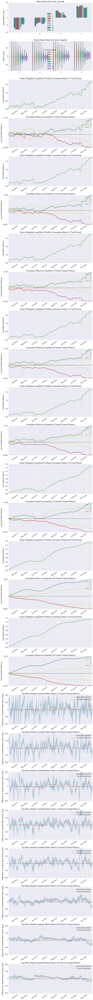

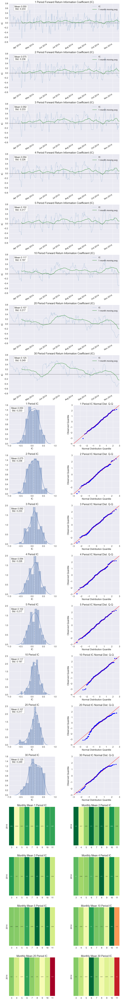

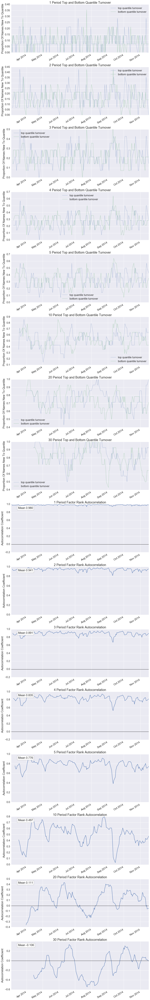

In [134]:
al.tears.create_full_tear_sheet(kalman_spread_zscore_factor_data_test)

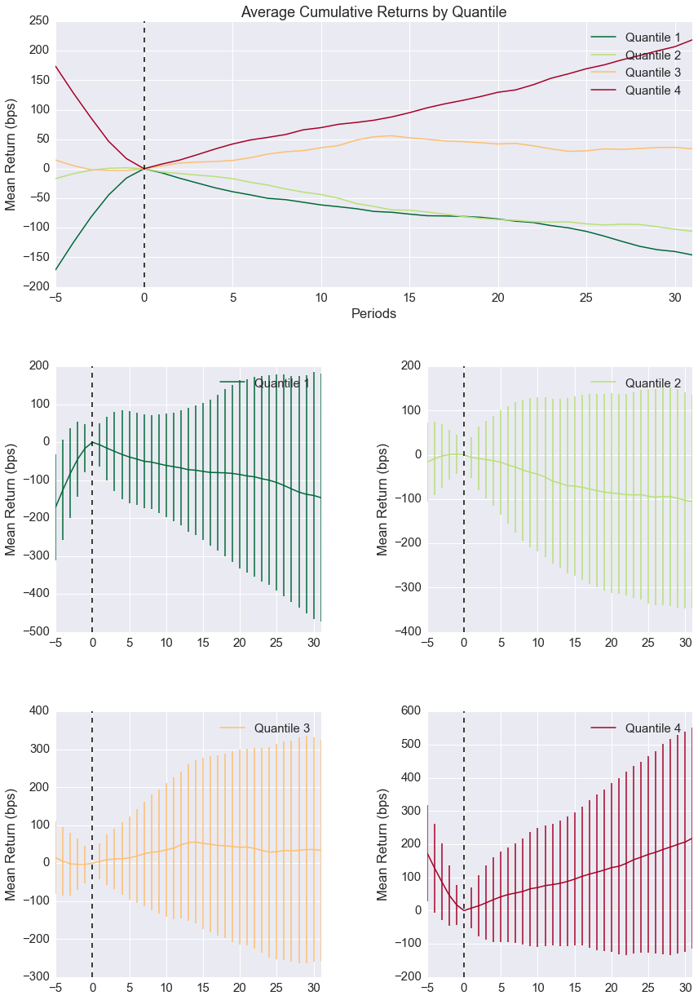

In [135]:
al.tears.create_event_returns_tear_sheet(kalman_spread_zscore_factor_data_test,
                                         prices=(spreads_test.iloc[lookback_window:]+60))

## We have positive returns!
Note that we also have a fairly low beta, hovering around 0 to 0.2.

### Applying More Leverage

In [137]:
kalman_spread_zscore_factor_data_test =\
al.utils.get_clean_factor_and_forward_returns(kal_spread_zscores_factor_test*(-1), 
                                              prices=(spreads_test.iloc[lookback_window:]+30),
                                              quantiles=4,
                                              periods=(1,2,3,4,5,10, 20, 30),
                                              bins=None)

Quantiles Statistics


,min,max,mean,std,count,count %
factor_quantile,,,,,,
1,-2.084836,-0.279344,-1.277987,0.341966,2548,25.0
2,-1.319974,0.825209,-0.500066,0.394528,2548,25.0
3,-0.749579,1.342550,0.400099,0.445476,2548,25.0
4,-0.093479,2.048861,1.204793,0.396507,2548,25.0


Returns Analysis


,1,2,3,4,5,10,20,30
Ann. alpha,0.424,0.396,0.411,0.391,0.375,0.291,0.246,0.252
beta,0.374,0.436,0.409,0.414,0.413,0.430,0.274,0.303
Mean Period Wise Return Top Quantile (bps),18.660,34.167,54.215,73.654,92.033,150.991,296.163,481.960
Mean Period Wise Return Bottom Quantile (bps),-14.945,-34.018,-51.436,-68.419,-83.383,-138.022,-203.130,-309.030
Mean Period Wise Spread (bps),33.605,33.980,35.073,35.358,34.899,28.611,24.695,25.993


Information Analysis


,1,2,3,4,5,10,20,30
IC Mean,0.051,0.078,0.093,0.096,0.104,0.121,0.109,0.126
IC Std.,0.233,0.235,0.233,0.226,0.217,0.198,0.218,0.250
t-stat(IC),2.923,4.474,5.379,5.721,6.453,8.202,6.750,6.774
p-value(IC),0.004,0.000,0.000,0.000,0.000,0.000,0.000,0.000
IC Skew,-0.027,-0.091,-0.104,-0.119,-0.087,-0.342,-0.957,-0.342
IC Kurtosis,-0.362,-0.322,-0.305,-0.260,-0.401,0.626,0.938,-0.540
Ann. IR,3.439,5.264,6.329,6.732,7.594,9.652,7.943,7.970


Turnover Analysis


,1,2,3,4,5,10,20,30
Quantile 1 Mean Turnover,0.090,0.159,0.221,0.277,0.331,0.525,0.734,0.802
Quantile 2 Mean Turnover,0.186,0.322,0.429,0.503,0.562,0.721,0.778,0.765
Quantile 3 Mean Turnover,0.191,0.330,0.434,0.505,0.561,0.710,0.772,0.767
Quantile 4 Mean Turnover,0.095,0.165,0.226,0.280,0.328,0.526,0.745,0.825


,1,2,3,4,5,10,20,30
Mean Factor Rank Autocorrelation,0.98,0.941,0.891,0.835,0.776,0.497,0.111,-0.106


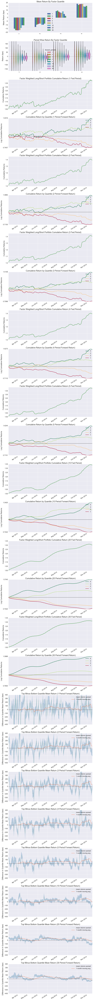

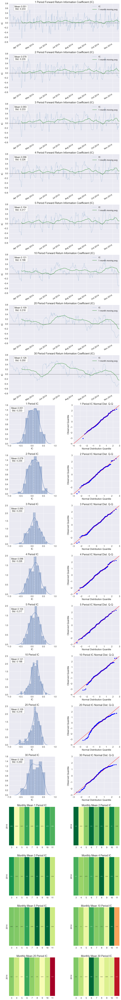

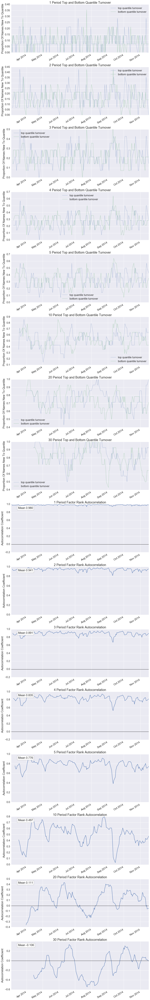

In [138]:
al.tears.create_full_tear_sheet(kalman_spread_zscore_factor_data_test)

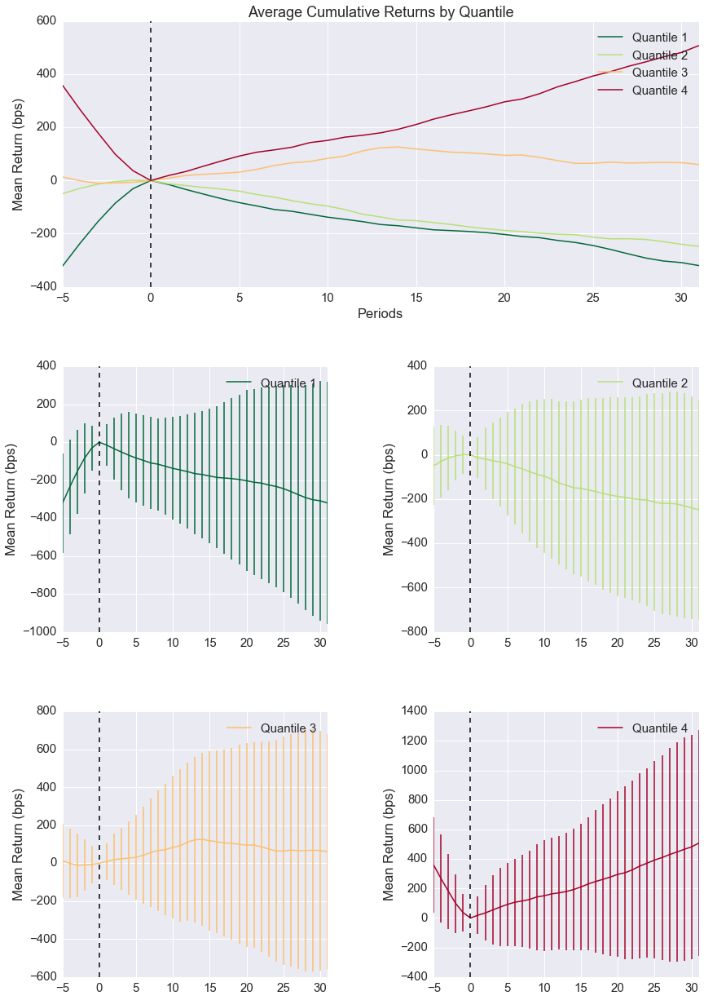

In [139]:
al.tears.create_event_returns_tear_sheet(kalman_spread_zscore_factor_data_test,
                                         prices=(spreads_test.iloc[lookback_window:]+30))